In [46]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, classification_report
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('Training.csv')
df.head()

,itching,skin_rash,nodal_skin_eruptions,continuous_sneezing,shivering,chills,joint_pain,stomach_pain,acidity,ulcers_on_tongue,...,blackheads,scurring,skin_peeling,silver_like_dusting,small_dents_in_nails,inflammatory_nails,blister,red_sore_around_nose,yellow_crust_ooze,prognosis
0,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Fungal infection
1,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Fungal infection
2,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Fungal infection
3,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Fungal infection
4,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Fungal infection


In [3]:
df.shape

(4920, 133)

In [4]:
#print(f'Dataset has {df.shape[0]} rows and {df.shape[1]} columns.')
print('The number of rows: ', df.shape[0])
print('The number of Columns: ', df.shape[1])

The number of rows:  4920
The number of Columns:  133


**Checking the null values**

In [5]:
#df.isnull().sum()
null_values = df.isnull().sum()
print("Null Values:\n", null_values[null_values > 0])

Null Values:
 Series([], dtype: int64)


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4920 entries, 0 to 4919
Columns: 133 entries, itching to prognosis
dtypes: int64(132), object(1)
memory usage: 5.0+ MB


1. **Total Entries**: The dataset contains 4,920 records, suggesting it is fairly large.

2. **Feature Count**: There are 133 columns, where 132 columns are likely symptoms or diagnostic features with integer values, indicating numerical encoding of categorical variables (e.g., presence or severity of symptoms).
 
3. **Target Variable**: There is one column (`prognosis`) of type `object`, which likely serves as the target variable, representing the diagnosis or predicted outcome.

Overall, this dataset appears to be designed for classification tasks, potentially predicting disease outcomes based on symptom indicators. The next steps would involve examining unique values, handling any missing data, and exploring patterns in the target variable.

In [7]:
df.describe()

,itching,skin_rash,nodal_skin_eruptions,continuous_sneezing,shivering,chills,joint_pain,stomach_pain,acidity,ulcers_on_tongue,...,pus_filled_pimples,blackheads,scurring,skin_peeling,silver_like_dusting,small_dents_in_nails,inflammatory_nails,blister,red_sore_around_nose,yellow_crust_ooze
count,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,...,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000
mean,0.137805,0.159756,0.021951,0.045122,0.021951,0.162195,0.139024,0.045122,0.045122,0.021951,...,0.021951,0.021951,0.021951,0.023171,0.023171,0.023171,0.023171,0.023171,0.023171,0.023171
std,0.344730,0.366417,0.146539,0.207593,0.146539,0.368667,0.346007,0.207593,0.207593,0.146539,...,0.146539,0.146539,0.146539,0.150461,0.150461,0.150461,0.150461,0.150461,0.150461,0.150461
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


1. **Binary Symptom Encoding**: Each feature appears to be encoded as binary (0 or 1), indicating the absence (0) or presence (1) of each symptom.
   
2. **Imbalance in Symptom Occurrence**: The mean values for most symptoms are low, indicating that the majority of symptoms are not present in most cases. This suggests potential sparsity in the dataset, with relatively few cases displaying certain symptoms.

3. **No Missing Data**: Since each symptom has 4,920 entries, it appears there is no missing data for these features.

4. **Target and Symptom Analysis**: This dataset likely supports a classification model where each binary feature represents a symptom contributing to a diagnosis or outcome, with `prognosis` as the target variable.

This data structure suits a clinical decision support system by helping predict a prognosis based on the presence of multiple symptoms.

## Preprocessing the Training Data

**Converting Categorical Data**

In [8]:
cat_g = df.select_dtypes(include=['object']).columns
print("Categorical Columns:\n", cat_g)

Categorical Columns:
 Index(['prognosis'], dtype='object')


In [9]:
for i in cat_g:
    print('Unique values in', str(i), 'is', df[i].nunique())
    print(df[i].value_counts())
    print('-----------------------')

Unique values in prognosis is 41
prognosis
Fungal infection                           120
Hepatitis C                                120
Hepatitis E                                120
Alcoholic hepatitis                        120
Tuberculosis                               120
Common Cold                                120
Pneumonia                                  120
Dimorphic hemmorhoids(piles)               120
Heart attack                               120
Varicose veins                             120
Hypothyroidism                             120
Hyperthyroidism                            120
Hypoglycemia                               120
Osteoarthristis                            120
Arthritis                                  120
(vertigo) Paroymsal  Positional Vertigo    120
Acne                                       120
Urinary tract infection                    120
Psoriasis                                  120
Hepatitis D                                120
Hepatitis B      

In [10]:
df.prognosis.unique()

array(['Fungal infection', 'Allergy', 'GERD', 'Chronic cholestasis',
       'Drug Reaction', 'Peptic ulcer diseae', 'AIDS', 'Diabetes ',
       'Gastroenteritis', 'Bronchial Asthma', 'Hypertension ', 'Migraine',
       'Cervical spondylosis', 'Paralysis (brain hemorrhage)', 'Jaundice',
       'Malaria', 'Chicken pox', 'Dengue', 'Typhoid', 'hepatitis A',
       'Hepatitis B', 'Hepatitis C', 'Hepatitis D', 'Hepatitis E',
       'Alcoholic hepatitis', 'Tuberculosis', 'Common Cold', 'Pneumonia',
       'Dimorphic hemmorhoids(piles)', 'Heart attack', 'Varicose veins',
       'Hypothyroidism', 'Hyperthyroidism', 'Hypoglycemia',
       'Osteoarthristis', 'Arthritis',
       '(vertigo) Paroymsal  Positional Vertigo', 'Acne',
       'Urinary tract infection', 'Psoriasis', 'Impetigo'], dtype=object)

In [11]:
df.prognosis.value_counts()

prognosis
Fungal infection                           120
Hepatitis C                                120
Hepatitis E                                120
Alcoholic hepatitis                        120
Tuberculosis                               120
Common Cold                                120
Pneumonia                                  120
Dimorphic hemmorhoids(piles)               120
Heart attack                               120
Varicose veins                             120
Hypothyroidism                             120
Hyperthyroidism                            120
Hypoglycemia                               120
Osteoarthristis                            120
Arthritis                                  120
(vertigo) Paroymsal  Positional Vertigo    120
Acne                                       120
Urinary tract infection                    120
Psoriasis                                  120
Hepatitis D                                120
Hepatitis B                                120
All

Becuse the target variable have multiple categories, i will do the label encoding rather then One-Hot Encode

In [12]:
df1 = df.copy()
df1.head()

,itching,skin_rash,nodal_skin_eruptions,continuous_sneezing,shivering,chills,joint_pain,stomach_pain,acidity,ulcers_on_tongue,...,blackheads,scurring,skin_peeling,silver_like_dusting,small_dents_in_nails,inflammatory_nails,blister,red_sore_around_nose,yellow_crust_ooze,prognosis
0,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Fungal infection
1,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Fungal infection
2,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Fungal infection
3,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Fungal infection
4,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Fungal infection


<Axes: xlabel='count', ylabel='prognosis'>

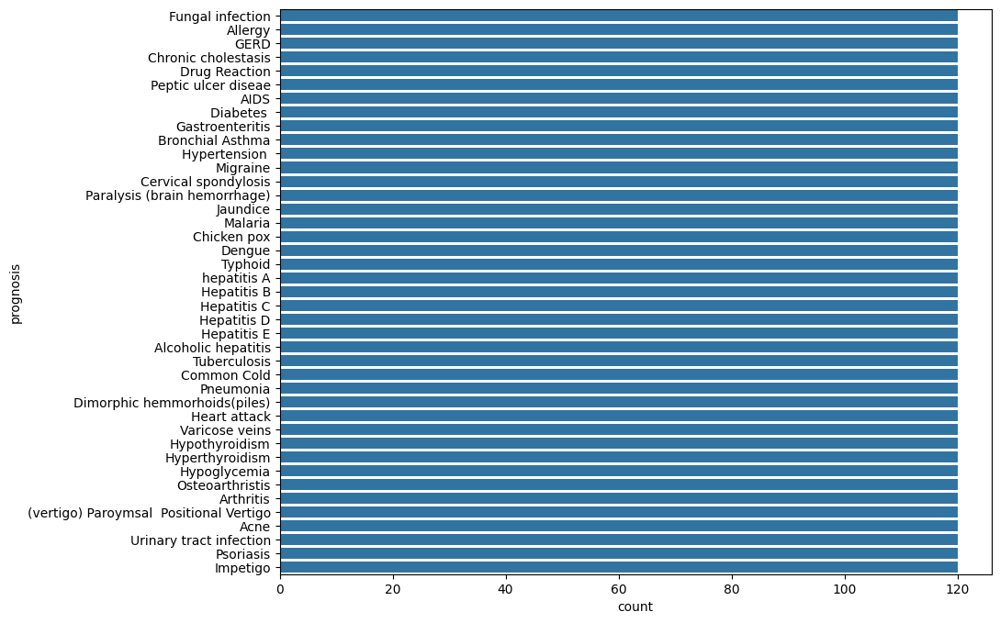

In [13]:
plt.figure(figsize=(10,8))
sns.countplot(df['prognosis'])

In [14]:
label_encoder = LabelEncoder()
df1['prognosis'] = label_encoder.fit_transform(df1['prognosis'])
df1.head()

,itching,skin_rash,nodal_skin_eruptions,continuous_sneezing,shivering,chills,joint_pain,stomach_pain,acidity,ulcers_on_tongue,...,blackheads,scurring,skin_peeling,silver_like_dusting,small_dents_in_nails,inflammatory_nails,blister,red_sore_around_nose,yellow_crust_ooze,prognosis
0,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,15
1,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,15
2,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,15
3,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,15
4,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,15


In [15]:
print("Encoded labels and their corresponding diseases:", dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_))))

Encoded labels and their corresponding diseases: {'(vertigo) Paroymsal  Positional Vertigo': 0, 'AIDS': 1, 'Acne': 2, 'Alcoholic hepatitis': 3, 'Allergy': 4, 'Arthritis': 5, 'Bronchial Asthma': 6, 'Cervical spondylosis': 7, 'Chicken pox': 8, 'Chronic cholestasis': 9, 'Common Cold': 10, 'Dengue': 11, 'Diabetes ': 12, 'Dimorphic hemmorhoids(piles)': 13, 'Drug Reaction': 14, 'Fungal infection': 15, 'GERD': 16, 'Gastroenteritis': 17, 'Heart attack': 18, 'Hepatitis B': 19, 'Hepatitis C': 20, 'Hepatitis D': 21, 'Hepatitis E': 22, 'Hypertension ': 23, 'Hyperthyroidism': 24, 'Hypoglycemia': 25, 'Hypothyroidism': 26, 'Impetigo': 27, 'Jaundice': 28, 'Malaria': 29, 'Migraine': 30, 'Osteoarthristis': 31, 'Paralysis (brain hemorrhage)': 32, 'Peptic ulcer diseae': 33, 'Pneumonia': 34, 'Psoriasis': 35, 'Tuberculosis': 36, 'Typhoid': 37, 'Urinary tract infection': 38, 'Varicose veins': 39, 'hepatitis A': 40}


## Exploratory Data Analysis

**Target Value Analysis**

Prognosis is our target variable as we aim to predict it.

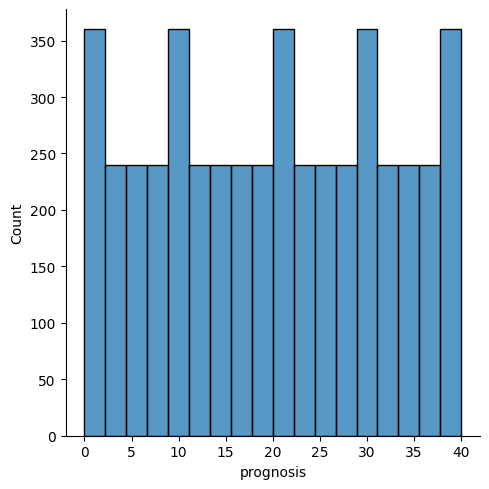

In [16]:
sns.displot(df1['prognosis'])

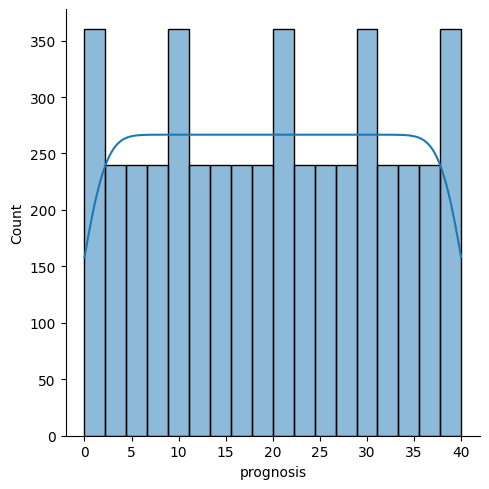

In [17]:
sns.displot(df1['prognosis'], kde=True)
#plt.savefig('prognosis_displot.png')

The histogram shows a uniform distribution of the prognosis variable. The data is evenly spread across the range of values, with no clear peaks or clusters. This suggests that the prognosis is not concentrated in any particular range and is distributed relatively evenly.

**Bar Plot for Target Variable Distribution**

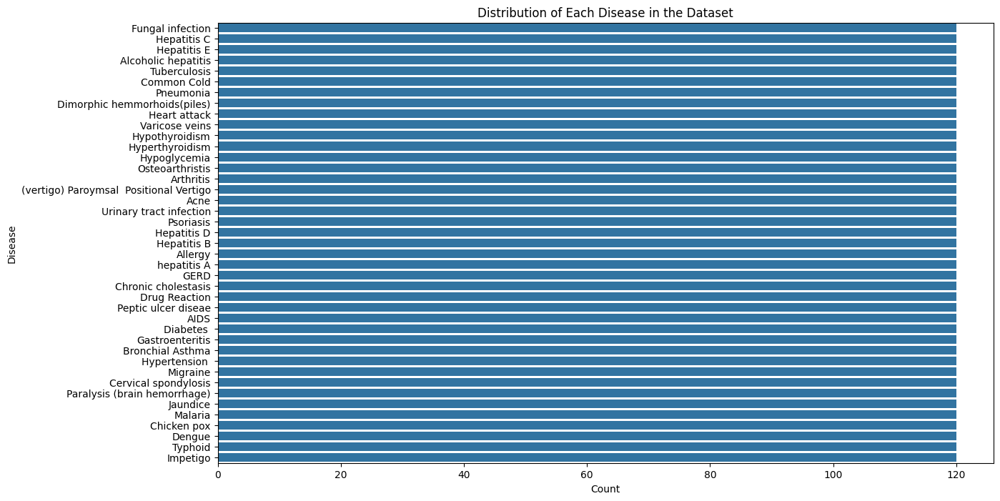

In [18]:
plt.figure(figsize=(14, 8))
sns.countplot(y='prognosis', data=df, order=df['prognosis'].value_counts().index)
plt.title("Distribution of Each Disease in the Dataset")
plt.xlabel("Count")
plt.ylabel("Disease")
plt.show()

**Heatmap for Symptom-Disease Correlation**

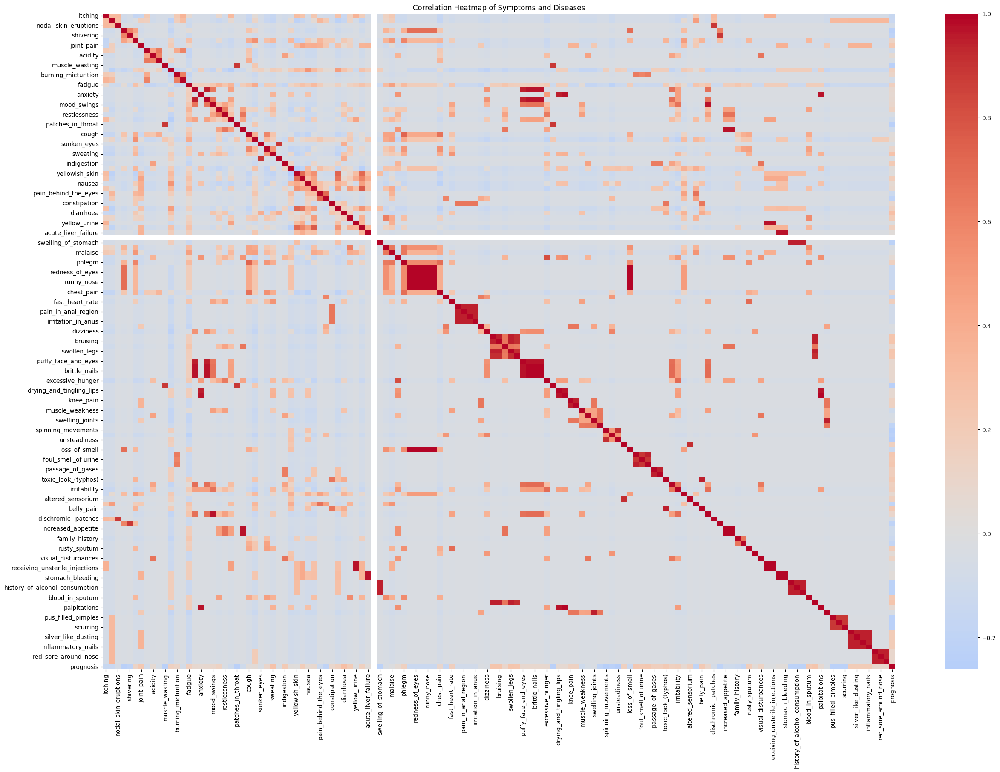

In [19]:
plt.figure(figsize=(30, 20))
correlation_matrix = df1.corr()
sns.heatmap(correlation_matrix, cmap="coolwarm", center=0)
plt.title("Correlation Heatmap of Symptoms and Diseases")
#plt.savefig('prognosis_heatmap.png')
plt.show()

The heatmap shows strong correlations between symptoms and diseases. However, correlation doesn't imply causation. Further analysis is needed to determine the clinical significance.. The darker the color, the stronger the correlation.

* **Strong Positive Correlations:** Many symptoms appear to be strongly correlated with each other, suggesting that they may often occur together.
* **Strong Negative Correlations:** Some symptoms have strong negative correlations, indicating that they are less likely to occur together.
* **Disease Correlations:** The heatmap also reveals correlations between different diseases, which could be useful for diagnosis and treatment.


<Axes: ylabel='prognosis'>

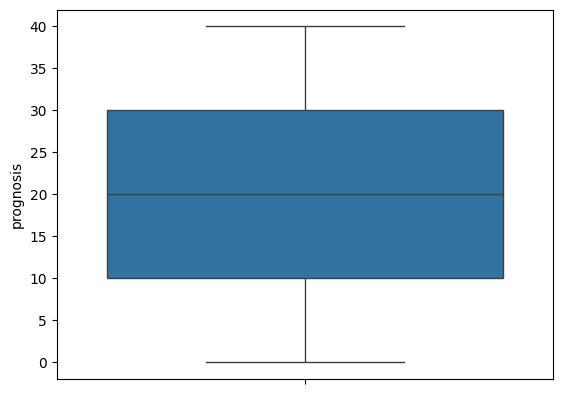

In [20]:
sns.boxplot(df1['prognosis'])
##plt.savefig('prognosis_boxplot.png')

The **prognosis** data is mostly clustered between 10 and 30, with a median around 20. There are a few extreme values, both very low and very high. This suggests some variability in the outcomes. 

The box plot shows a distribution skewed to the right, with a median around 20. The interquartile range is 15, and there are two outliers.

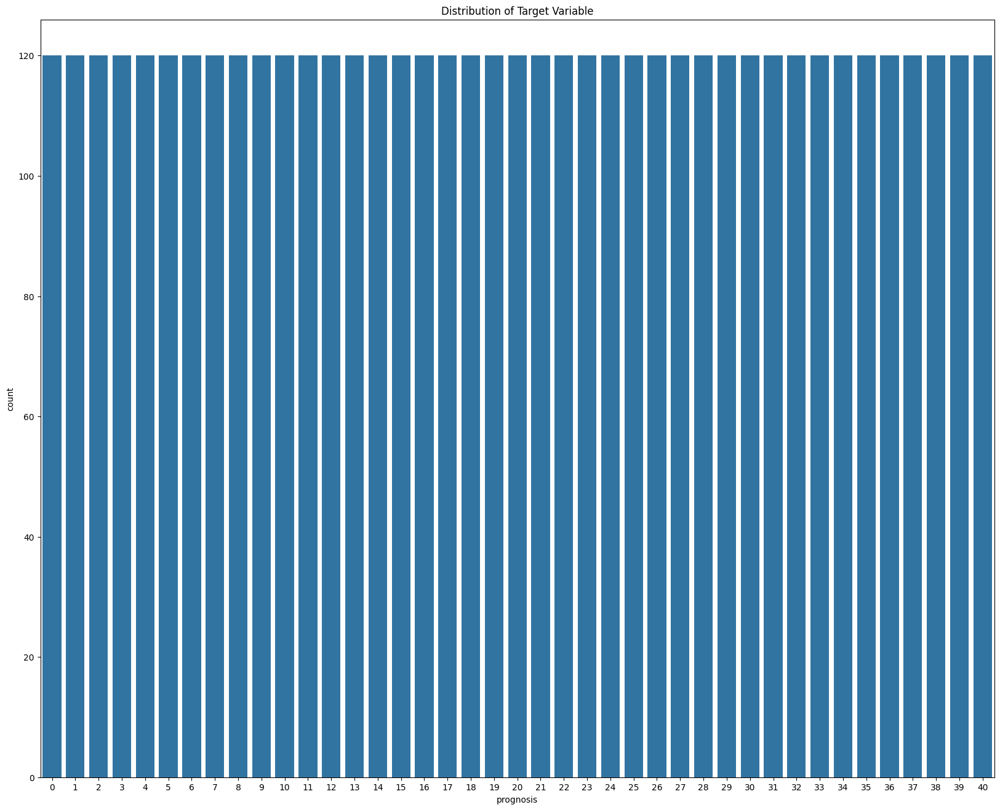

In [21]:
plt.figure(figsize=(20, 16))
sns.countplot(x='prognosis', data=df1)
plt.title('Distribution of Target Variable')
plt.show()

**Scaling Numerical Data**

In [22]:
numerical_cols = df1.select_dtypes(include=['float64', 'int64']).columns
scaler = StandardScaler()
df1[numerical_cols] = scaler.fit_transform(df1[numerical_cols])

**Distribution of Continuous Variables**

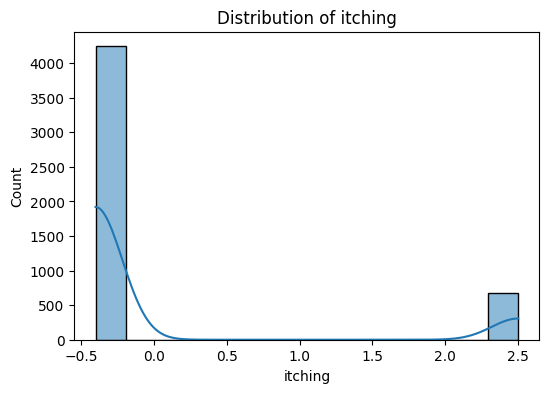

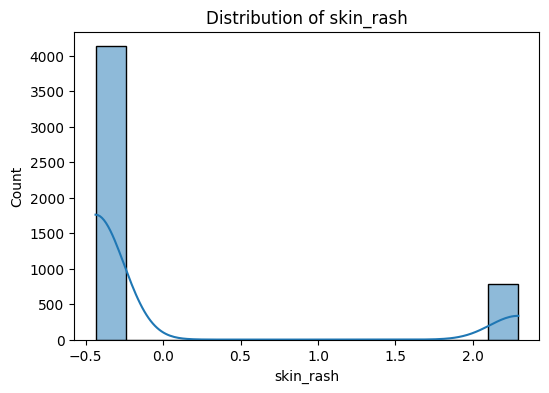

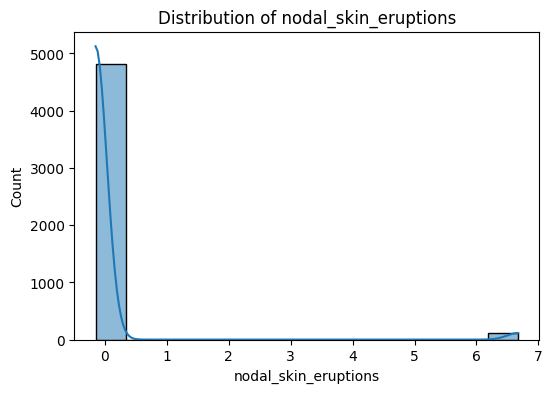

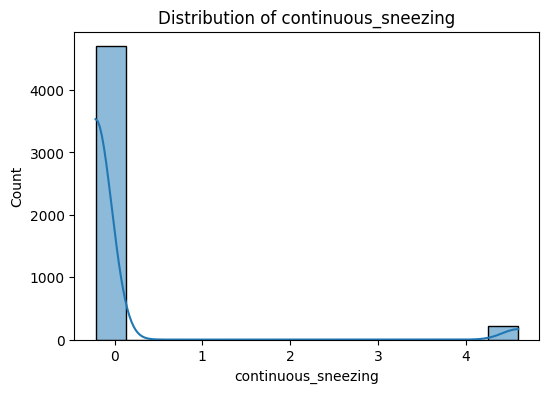

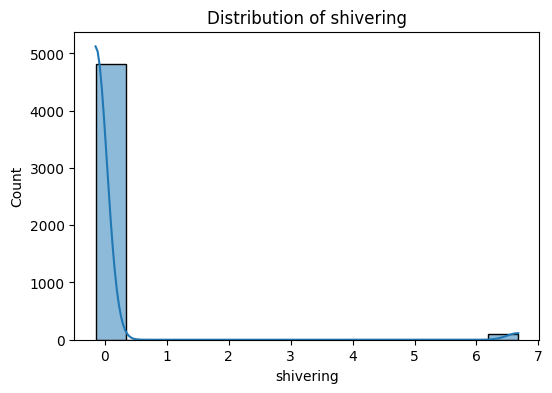

...

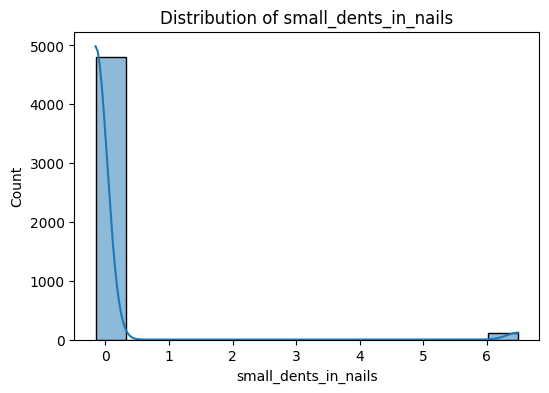

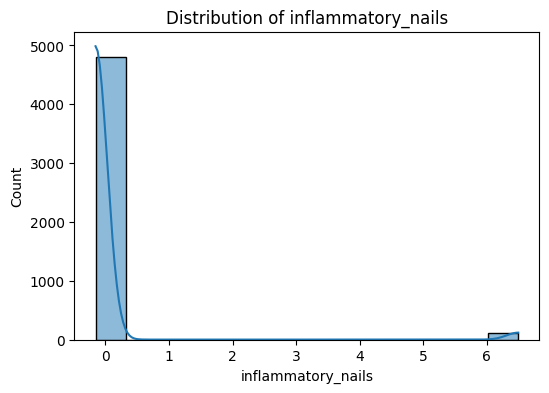

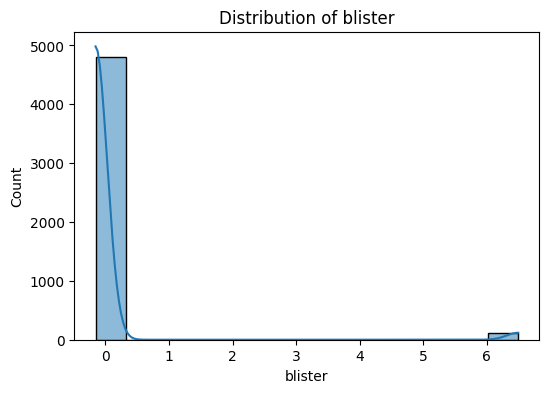

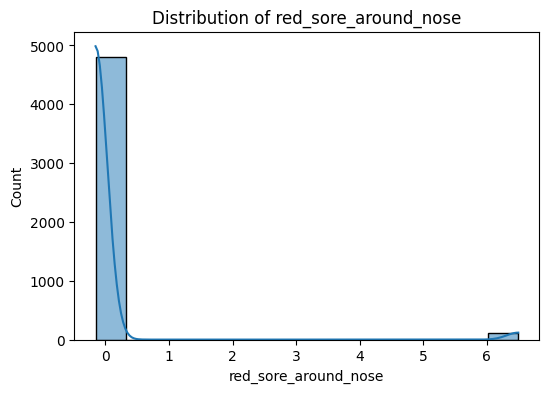

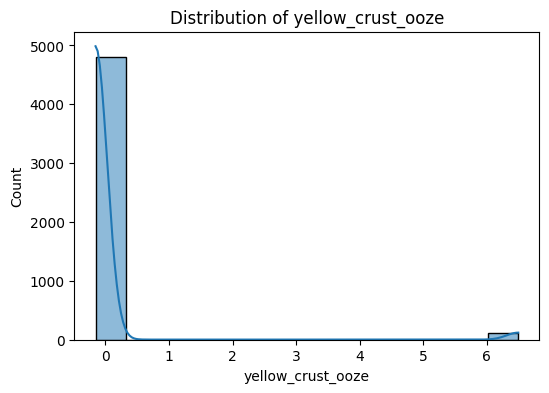

In [23]:
for col in numerical_cols:
    plt.figure(figsize=(6, 4))
    sns.histplot(df1[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.show()

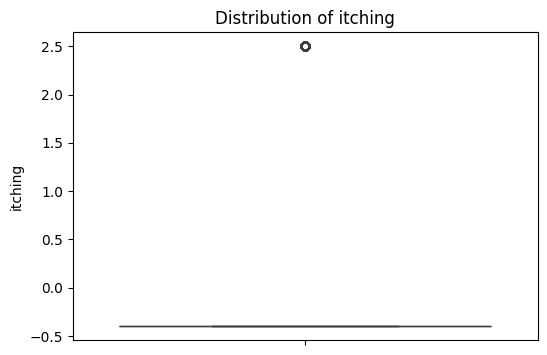

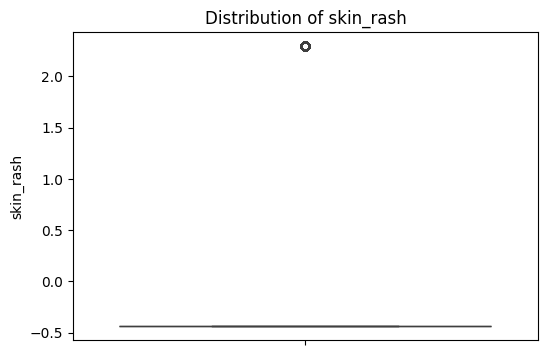

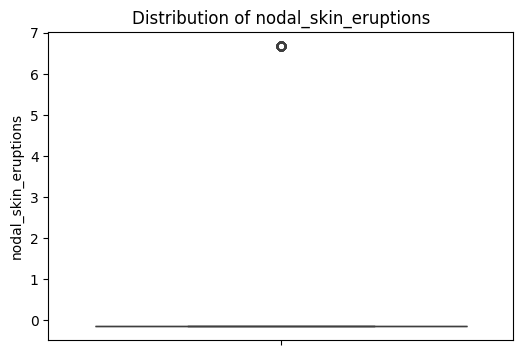

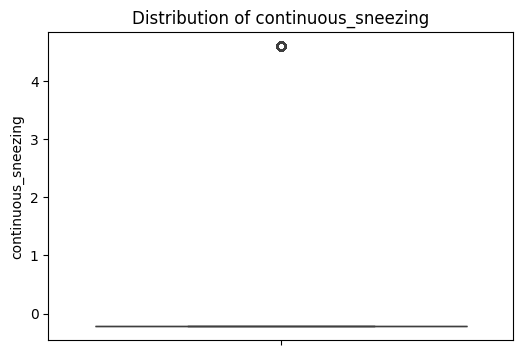

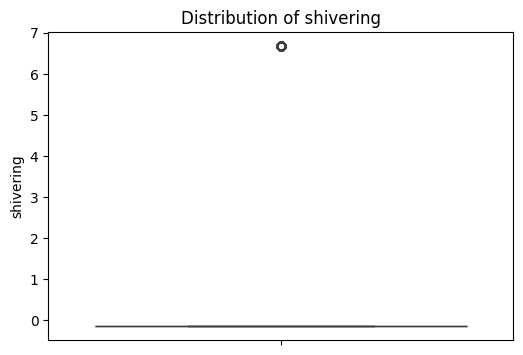

...

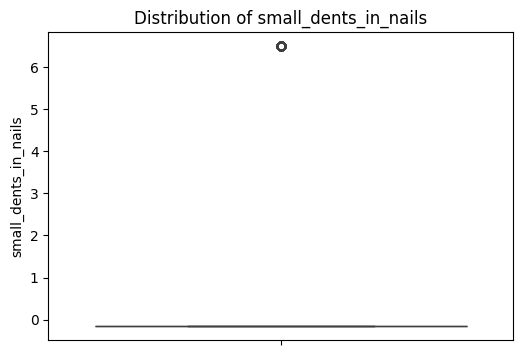

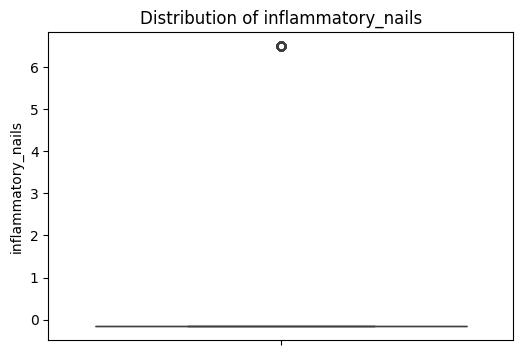

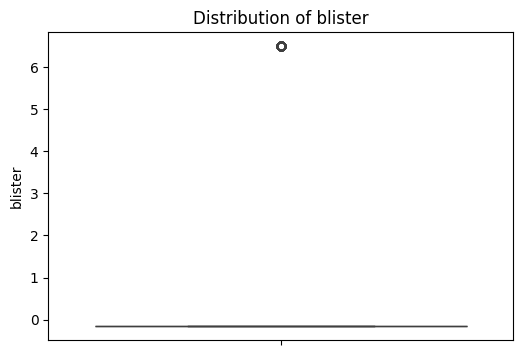

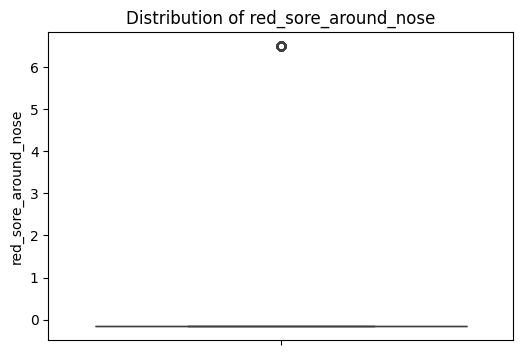

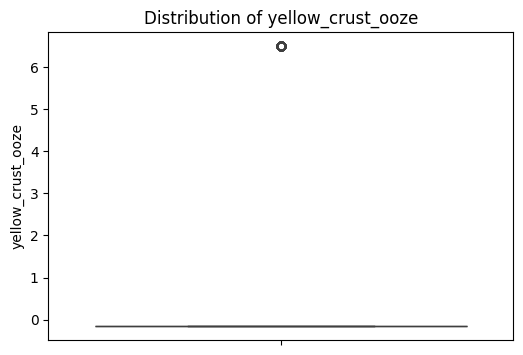

In [24]:
for col in numerical_cols:
    plt.figure(figsize=(6, 4))
    sns.boxplot(df1[col])
    plt.title(f'Distribution of {col}')
    #plt.savefig('distribution_boxplot.png')
    plt.show()

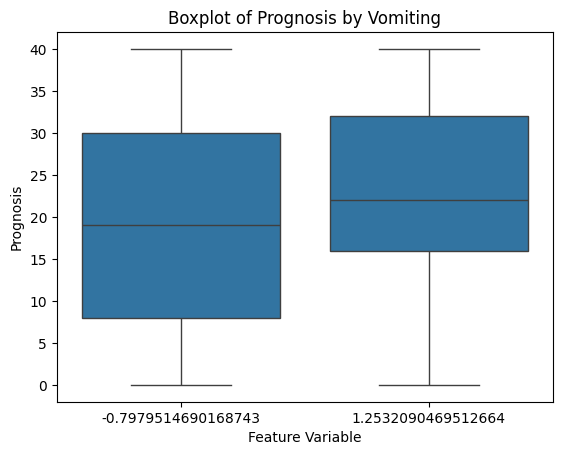

In [25]:
sns.boxplot(x='vomiting', y='prognosis', data=df1)
plt.title('Boxplot of Prognosis by Vomiting')
plt.xlabel('Feature Variable')
plt.ylabel('Prognosis')
plt.show()

The boxplot shows a slightly higher median "Prognosis" for patients with higher "Vomiting" values. The variability in "Prognosis" is also slightly larger for this group.

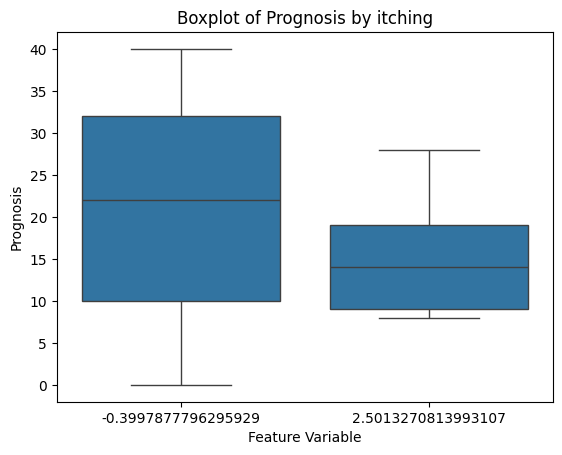

In [26]:
sns.boxplot(x='itching', y='prognosis', data=df1)
plt.title('Boxplot of Prognosis by itching')
plt.xlabel('Feature Variable')
plt.ylabel('Prognosis')
plt.savefig('prognosis.png')
plt.show()

The boxplot shows a higher median "Prognosis" for patients with lower "Itching" values. The variability in "Prognosis" is also higher for this group. 

Based on the boxplots, it seems that there's a general trend where higher values of certain features (like "Vomiting", "Fatigue", and "High Fever") are associated with a higher median "Prognosis". Conversely, lower values of most other features tend to be associated with a higher median "Prognosis".

**Relationships between Features and Target Variable**

**Bivariate Analysis**

In [27]:
print(df1.columns)

Index(['itching', 'skin_rash', 'nodal_skin_eruptions', 'continuous_sneezing',
       'shivering', 'chills', 'joint_pain', 'stomach_pain', 'acidity',
       'ulcers_on_tongue',
       ...
       'blackheads', 'scurring', 'skin_peeling', 'silver_like_dusting',
       'small_dents_in_nails', 'inflammatory_nails', 'blister',
       'red_sore_around_nose', 'yellow_crust_ooze', 'prognosis'],
      dtype='object', length=133)


In [28]:
for col in df1.columns:
    print(col)

itching
skin_rash
nodal_skin_eruptions
continuous_sneezing
shivering
chills
joint_pain
stomach_pain
acidity
ulcers_on_tongue
muscle_wasting
vomiting
burning_micturition
spotting_ urination
fatigue
weight_gain
anxiety
cold_hands_and_feets
mood_swings
weight_loss
restlessness
lethargy
patches_in_throat
irregular_sugar_level
cough
high_fever
sunken_eyes
breathlessness
sweating
dehydration
indigestion
headache
yellowish_skin
dark_urine
nausea
loss_of_appetite
pain_behind_the_eyes
back_pain
constipation
abdominal_pain
diarrhoea
mild_fever
yellow_urine
yellowing_of_eyes
acute_liver_failure
fluid_overload
swelling_of_stomach
swelled_lymph_nodes
malaise
blurred_and_distorted_vision
phlegm
throat_irritation
redness_of_eyes
sinus_pressure
runny_nose
congestion
chest_pain
weakness_in_limbs
fast_heart_rate
pain_during_bowel_movements
pain_in_anal_region
bloody_stool
irritation_in_anus
neck_pain
dizziness
cramps
bruising
obesity
swollen_legs
swollen_blood_vessels
puffy_face_and_eyes
enlarged_thyroi

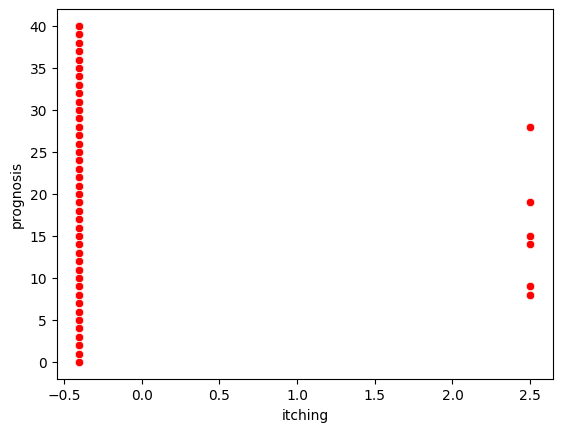

In [29]:
sns.scatterplot(x='itching', y='prognosis', data=df1, color='r')
plt.savefig('itching_prognosis.png')

The scatter plot shows a weak positive correlation between itching and prognosis. This means that as itching increases, prognosis tends to increase slightly. However, the correlation is not very strong, and there is a lot of variability in the data.

<Axes: xlabel='skin_rash', ylabel='prognosis'>

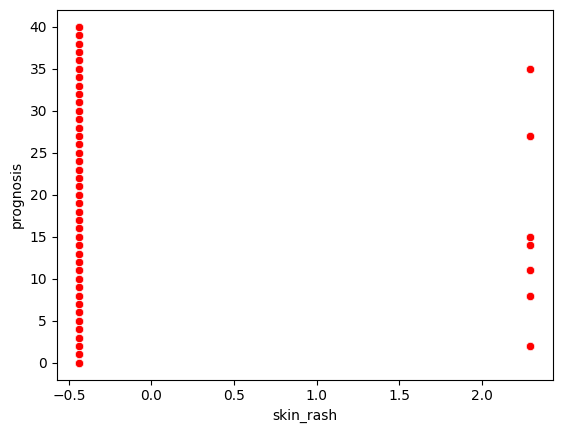

In [30]:
sns.scatterplot(x='skin_rash', y='prognosis', data=df1, color='r')
#plt.savefig('skin_rash_prognosis.png')

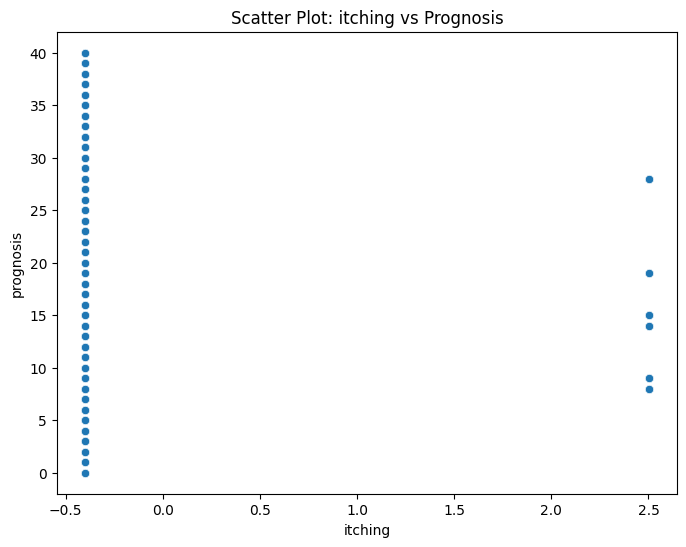

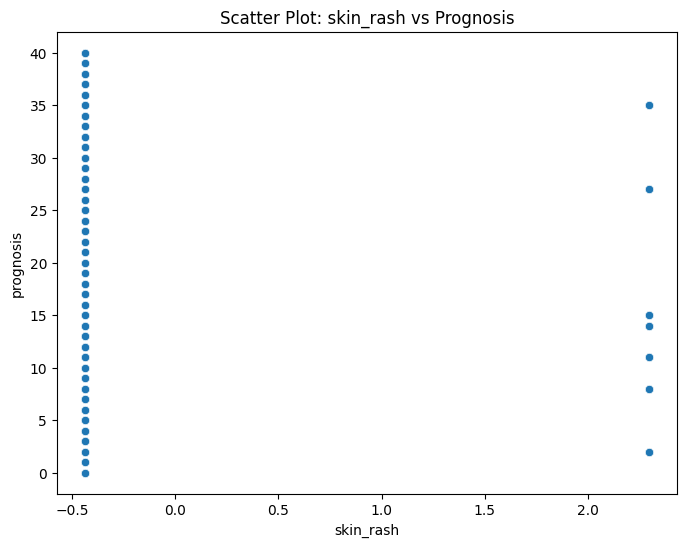

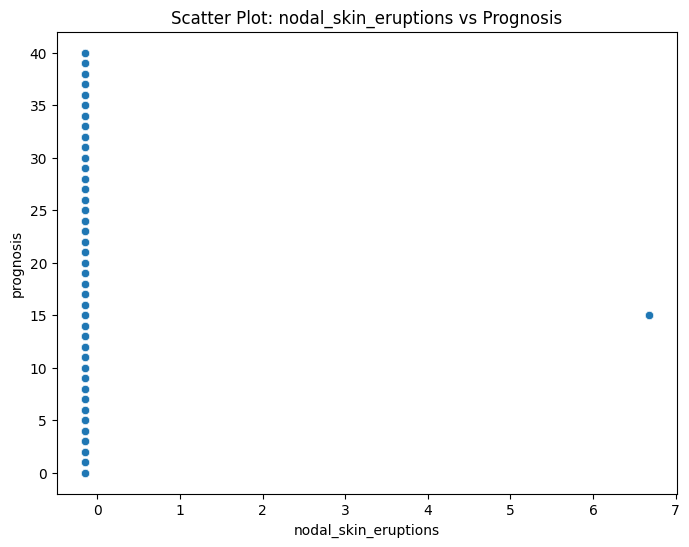

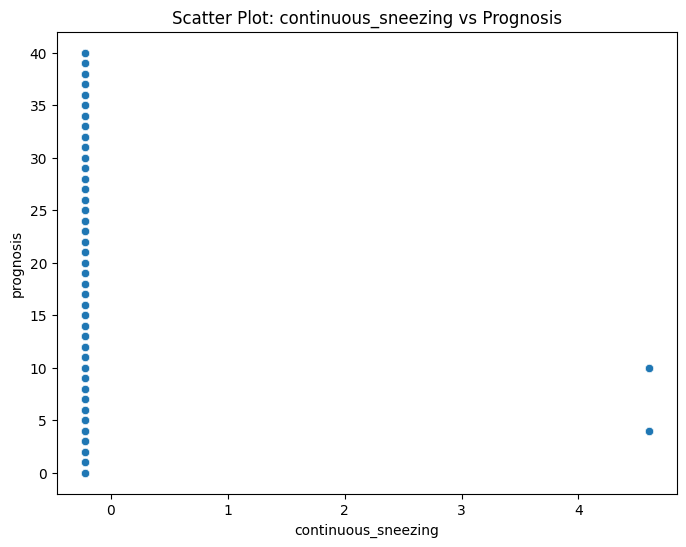

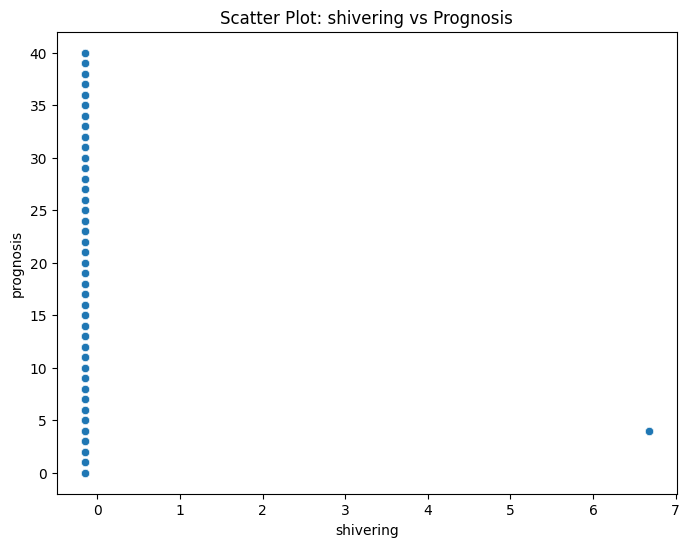

...

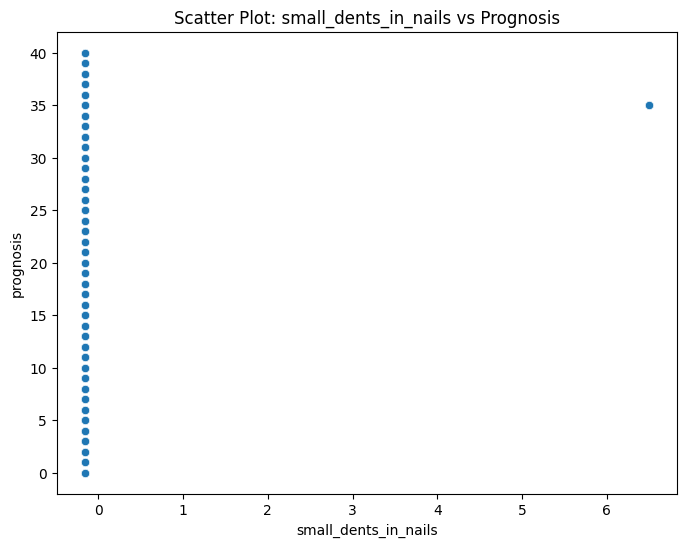

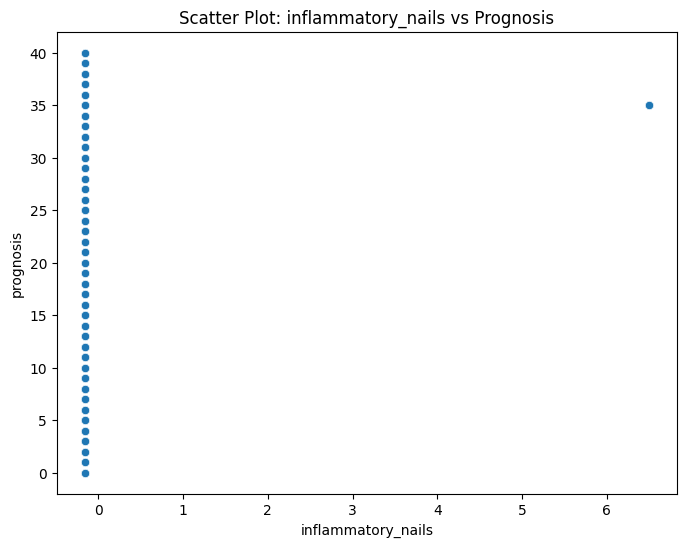

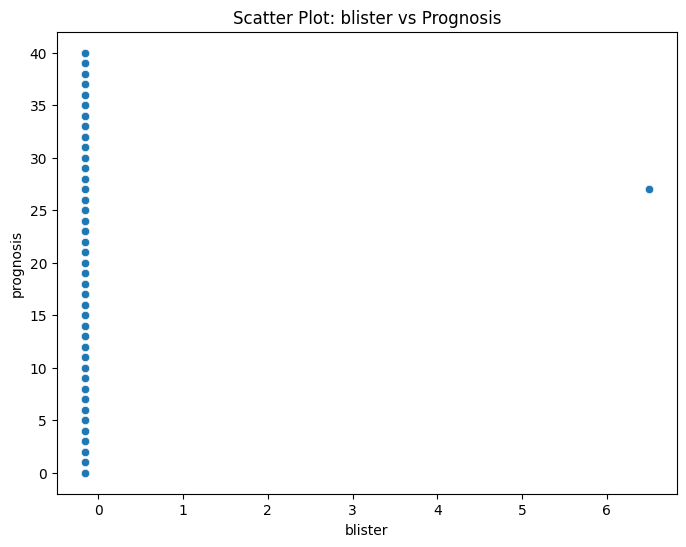

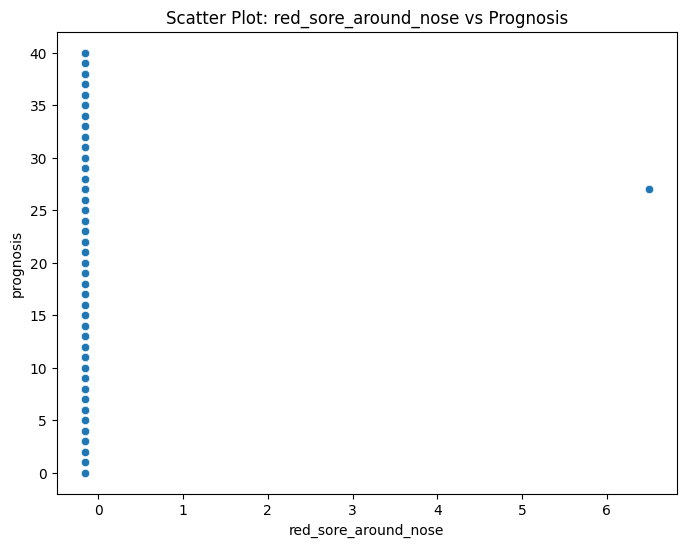

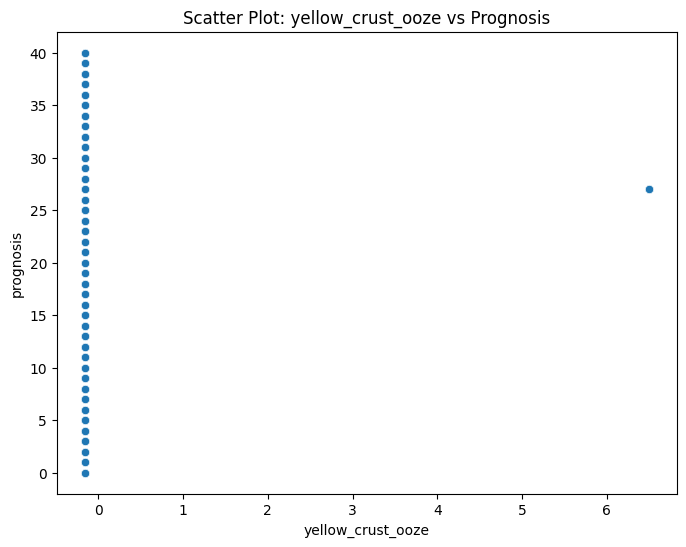

In [31]:
for col in df1.columns[:-1]:  
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=col, y='prognosis', data=df1)
    plt.title(f'Scatter Plot: {col} vs Prognosis')
    plt.savefig(f'scatterplot_{col}.png')
    plt.show()

In [32]:
import matplotlib.image as mpimg

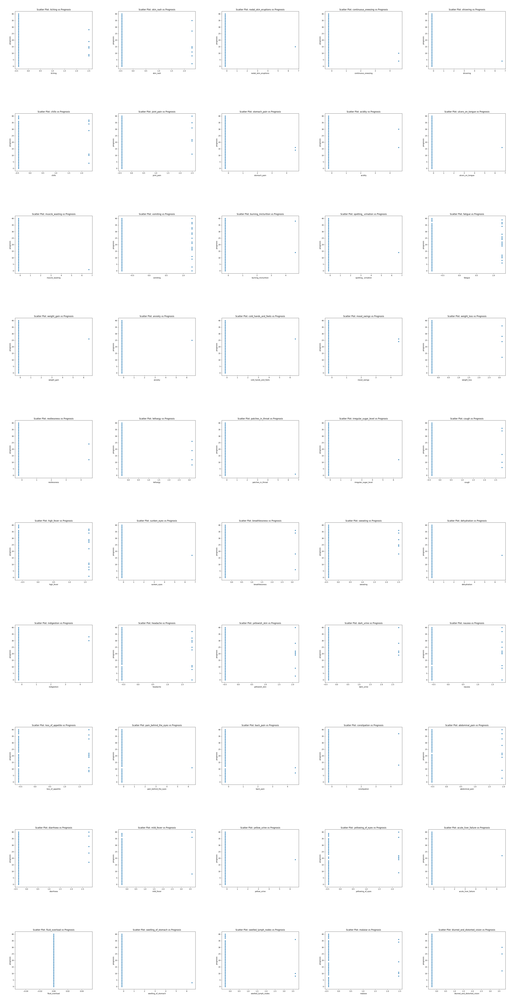

In [33]:
images = []
for col in df1.columns[:-1]:
    images.append(mpimg.imread(f'scatterplot_{col}.png'))

# Create a figure with multiple subplots
fig, axes = plt.subplots(nrows=10, ncols=5, figsize=(20, 40))
for i, ax in enumerate(axes.flat):
    if i < len(images):
        ax.imshow(images[i])
        ax.axis('off')

plt.tight_layout()
plt.show()
# Save the combined figure
fig.savefig('combined_scatterplots.png')

These scatter plots shows a weak positive correlation between them and prognosis.

**Identifying Important Features for Correlation Analysis**

BTo identify the most important features for correlation analysis with the "Prognosis" variable, let's combine domain knowledge and data-driven approaches:

Based on common medical knowledge, the following features might be strongly correlated with prognosis:

* **Core Symptoms:**
    - Fever
    - Cough
    - Fatigue
    - Shortness of breath
    - Muscle aches
    - Headache
    - Loss of appetite
    - Weight loss
* **Severe Symptoms:**
    - Difficulty breathing
    - Chest pain
    - Confusion
    - Severe abdominal pain
    - Blood in stool or vomit
* **Chronic Conditions:**
    - Diabetes
    - Heart disease
    - Kidney disease
    - Liver disease
* **Lifestyle Factors:**
    - Smoking
    - Alcohol consumption
    - Drug use
    - Diet
    - Exercise


In [34]:
from sklearn.ensemble import RandomForestRegressor

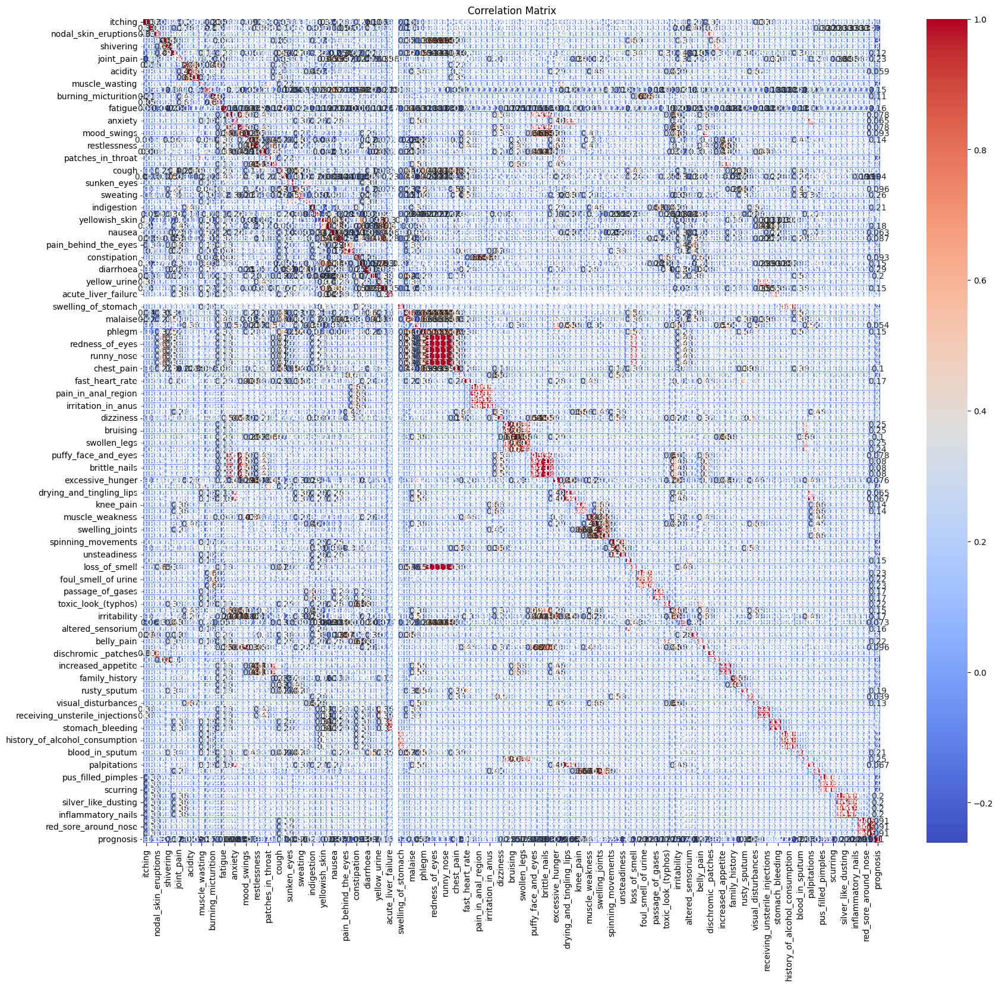

In [35]:
corr_matrix = df1.corr()
plt.figure(figsize=(20, 18))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

**Feature Importance using Random Forest**

In [36]:
X = df1.drop('prognosis', axis=1)
y = df1['prognosis']

rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X, y)

RandomForestRegressor(random_state=42)

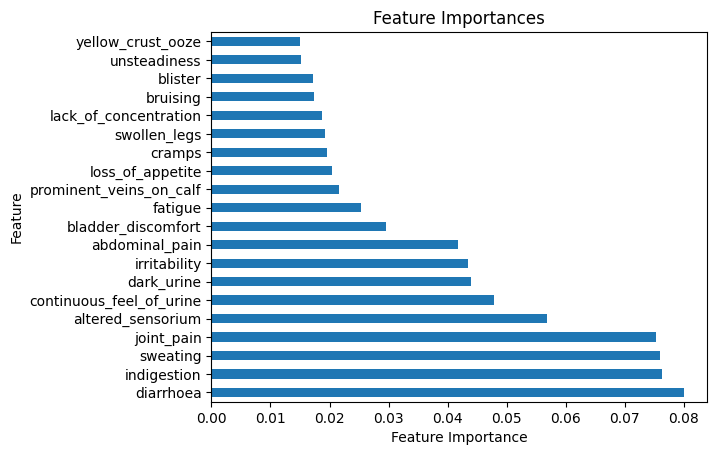

In [37]:
feature_importances = pd.Series(rf.feature_importances_, index=X.columns)
feature_importances.nlargest(20).plot(kind='barh')
plt.title('Feature Importances')
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.show()

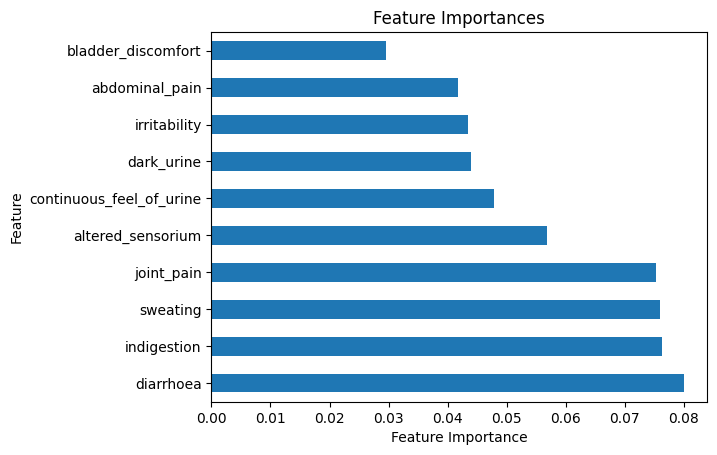

In [38]:
feature_importances = pd.Series(rf.feature_importances_, index=X.columns)
feature_importances.nlargest(10).plot(kind='barh')
plt.title('Feature Importances')
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.savefig('feature_importances_.png')
plt.show()

The bar chart shows the feature importances calculated using a machine learning model, likely a Random Forest. Here are the key insights:

**Most Important Features:**

* **diarrhoea:** This feature has the highest importance, suggesting it has a strong influence on the prediction of the target variable (likely "Prognosis").
* **indigestion:** This feature also has a significant impact on the prediction.
* **sweating:** This feature is also considered important in predicting the target variable.

**Less Important Features:**

* Features like "discomfort," "minimal_pain," and "irritability" have lower importance scores, indicating they may have a weaker influence on the prediction.

In [39]:
import statsmodels.api as sm
model = sm.OLS(y, X).fit()
print(model.summary())

                                 OLS Regression Results                                
Dep. Variable:              prognosis   R-squared (uncentered):                   0.254
Model:                            OLS   Adj. R-squared (uncentered):              0.235
Method:                 Least Squares   F-statistic:                              13.59
Date:                Wed, 13 Nov 2024   Prob (F-statistic):                   4.26e-221
Time:                        19:20:05   Log-Likelihood:                         -21739.
No. Observations:                4920   AIC:                                  4.372e+04
Df Residuals:                    4800   BIC:                                  4.450e+04
Df Model:                         120                                                  
Covariance Type:            nonrobust                                                  
                                     coef    std err          t      P>|t|      [0.025      0.975]
---------------------

This is a summary of an OLS regression model predicting "prognosis" based on multiple symptoms. The key metrics of the model are:

1. **R-squared**: 0.254, indicating that 25.4% of the variance in prognosis can be explained by the model, though without a constant (uncentered R-squared).
2. **Adjusted R-squared**: 0.235, which accounts for the number of predictors.
3. **F-statistic**: 13.59, with a p-value of 4.26e-221, showing the overall model is statistically significant.
4. **Log-Likelihood**: -21739, and **AIC** and **BIC** scores (43,720 and 44,500, respectively), which are used for model selection.

The coefficient values provide insight into the influence of each symptom on prognosis, with `muscle_pain` (p = 0.020) and `mucoid_sputum` (p = 0.010) among a few significant predictors. However, the majority of symptom coefficients have high p-values, indicating that they are not statistically significant predictors.

## Summary


1. **Dataset Size and Structure**:
   - The dataset consists of 4,920 rows and 133 columns.
   - The columns represent various symptoms (like "itching," "skin_rash," "nodal_skin_eruptions") and one final column labeled "prognosis," which indicates the diagnosed condition.

2. **Data Types**:
   - Most columns (132 of them) are binary indicators (0 or 1) showing the presence or absence of symptoms for each individual.
   - The "prognosis" column, which is of type `object`, contains categorical labels for different medical diagnoses or conditions.

3. **Prognosis Column**:
   - There are 41 unique categories in the "prognosis" column, indicating that the dataset covers 41 distinct medical conditions.
   - The most common diagnosis is "Fungal infection," appearing in 120 cases.

4. **Symptoms**:
   - For many symptoms, the mean values are close to zero, meaning most of the symptoms are not present in a majority of cases. For example:
     - **Itching** has a mean of approximately 0.14, indicating that itching is present in around 14% of cases.
     - **Skin Rash** has a mean of about 0.16, showing a 16% occurrence rate across cases.

5. **Distribution of Symptoms**:
   - Since each symptom is represented as a binary variable (0 or 1), the data seems to be sparse, with most symptoms being absent (0) in the majority of rows.
   - Symptoms like "itching," "chills," and "joint_pain" appear more frequently, while others, like "blackheads," "scurring," and "skin_peeling," have very low frequencies.

6. **Potential Insights**:
   - The dataset is likely suited for a classification task where symptoms serve as features and "prognosis" as the target variable.
   - This structure allows for developing a model that predicts a diagnosis based on observed symptoms, given the comprehensive symptom set and the balanced representation of various prognoses. 

This dataset appears well-suited for a diagnostic prediction model that could leverage symptom patterns to identify specific medical conditions. The binary encoding and the broad range of conditions covered should allow for robust training, testing, and validation of predictive models in health diagnostics.

In [40]:
df1.describe()

,itching,skin_rash,nodal_skin_eruptions,continuous_sneezing,shivering,chills,joint_pain,stomach_pain,acidity,ulcers_on_tongue,...,blackheads,scurring,skin_peeling,silver_like_dusting,small_dents_in_nails,inflammatory_nails,blister,red_sore_around_nose,yellow_crust_ooze,prognosis
count,4.920000e+03,4.920000e+03,4.920000e+03,4920.000000,4.920000e+03,4.920000e+03,4.920000e+03,4.920000e+03,4.920000e+03,4.920000e+03,...,4.920000e+03,4.920000e+03,4.920000e+03,4.920000e+03,4.920000e+03,4.920000e+03,4.920000e+03,4.920000e+03,4.920000e+03,4920.000000
mean,-2.743966e-17,-1.155354e-17,-4.332578e-18,0.000000,-1.155354e-17,-2.888385e-17,-6.932124e-17,-3.754901e-17,1.155354e-17,-1.155354e-17,...,-4.621416e-17,-3.899320e-17,8.665155e-18,8.665155e-18,8.665155e-18,8.665155e-18,1.155354e-17,1.155354e-17,1.155354e-17,20.000000
std,1.000102e+00,1.000102e+00,1.000102e+00,1.000102,1.000102e+00,1.000102e+00,1.000102e+00,1.000102e+00,1.000102e+00,1.000102e+00,...,1.000102e+00,1.000102e+00,1.000102e+00,1.000102e+00,1.000102e+00,1.000102e+00,1.000102e+00,1.000102e+00,1.000102e+00,11.833362
min,-3.997878e-01,-4.360397e-01,-1.498129e-01,-0.217380,-1.498129e-01,-4.399947e-01,-4.018371e-01,-2.173802e-01,-2.173802e-01,-1.498129e-01,...,-1.498129e-01,-1.498129e-01,-1.540141e-01,-1.540141e-01,-1.540141e-01,-1.540141e-01,-1.540141e-01,-1.540141e-01,-1.540141e-01,0.000000
25%,-3.997878e-01,-4.360397e-01,-1.498129e-01,-0.217380,-1.498129e-01,-4.399947e-01,-4.018371e-01,-2.173802e-01,-2.173802e-01,-1.498129e-01,...,-1.498129e-01,-1.498129e-01,-1.540141e-01,-1.540141e-01,-1.540141e-01,-1.540141e-01,-1.540141e-01,-1.540141e-01,-1.540141e-01,10.000000
50%,-3.997878e-01,-4.360397e-01,-1.498129e-01,-0.217380,-1.498129e-01,-4.399947e-01,-4.018371e-01,-2.173802e-01,-2.173802e-01,-1.498129e-01,...,-1.498129e-01,-1.498129e-01,-1.540141e-01,-1.540141e-01,-1.540141e-01,-1.540141e-01,-1.540141e-01,-1.540141e-01,-1.540141e-01,20.000000
75%,-3.997878e-01,-4.360397e-01,-1.498129e-01,-0.217380,-1.498129e-01,-4.399947e-01,-4.018371e-01,-2.173802e-01,-2.173802e-01,-1.498129e-01,...,-1.498129e-01,-1.498129e-01,-1.540141e-01,-1.540141e-01,-1.540141e-01,-1.540141e-01,-1.540141e-01,-1.540141e-01,-1.540141e-01,30.000000
max,2.501327e+00,2.293369e+00,6.674995e+00,4.600235,6.674995e+00,2.272755e+00,2.488570e+00,4.600235e+00,4.600235e+00,6.674995e+00,...,6.674995e+00,6.674995e+00,6.492911e+00,6.492911e+00,6.492911e+00,6.492911e+00,6.492911e+00,6.492911e+00,6.492911e+00,40.000000


1. **Symptom Standardization**:
   - The data shows a mean close to zero and a standard deviation close to one across all symptoms, suggesting that each feature has been standardized. This standardization would help in machine learning models by equalizing feature impact and improving convergence speed for models that are sensitive to scaling, such as logistic regression and neural networks.

2. **Prognosis (Target Variable)**:
   - The mean of the "prognosis" column is 20, with a minimum of 0 and a maximum of 40, indicating that this column likely represents different diagnostic categories encoded as integers (e.g., 0 to 40 for 41 classes).
   - This target variable has a standard deviation of around 11.8, which may suggest some imbalance, with certain diagnoses occurring more frequently. The quartiles (10, 20, 30) indicate that certain classes may group within these ranges, possibly giving hints about common diagnoses in the dataset.

3. **Symptom Range**:
   - The symptom columns display a range between approximately -0.4 and +6.5, with many showing minimum values near -0.4 and maximum values in the range of 2.3 to 6.7. 
   - Such a range hints at the use of transformations (e.g., logarithmic or exponential adjustments) to bring outliers closer, enhancing the model’s ability to capture variability across features without giving undue weight to extreme values.

4. **Quartile Insights and Symptom Distribution**:
   - The 25th, 50th, and 75th percentiles for each symptom appear consistently around the -0.4 range, indicating a large number of symptoms are close to this value for most entries. This uniformity suggests that, even after scaling, most symptoms remain inactive or less present (possibly encoded as a value near -0.4).
   - Symptoms with a maximum closer to 6.5 are likely outliers or rare cases, as they are substantially higher than the mean and interquartile range, hinting that only a few individuals exhibit such symptoms. 

5. **Symptom Importance and Sparsity**:
   - The scaling has not fundamentally changed the sparsity of the dataset. Most of the symptoms have values clustered near the lower end (-0.4), indicating that they are less commonly active across entries. This sparseness likely reflects the rarity of many symptoms within each diagnosis, meaning only a few symptoms may be critical for identifying a condition.

6. **Modeling Implications**:
   - With symptoms centered and scaled, this dataset is ready for algorithms that benefit from standardized data, like Support Vector Machines, PCA, and neural networks. The standardization will improve interpretability and model performance, especially in models sensitive to the scale of features.
   - The data still has a high level of sparsity, which might impact certain machine learning models negatively. Techniques like feature selection, dimensionality reduction, or even symptom clustering may help reduce dimensionality and improve performance.

**Prognosis Distribution with Histogram**

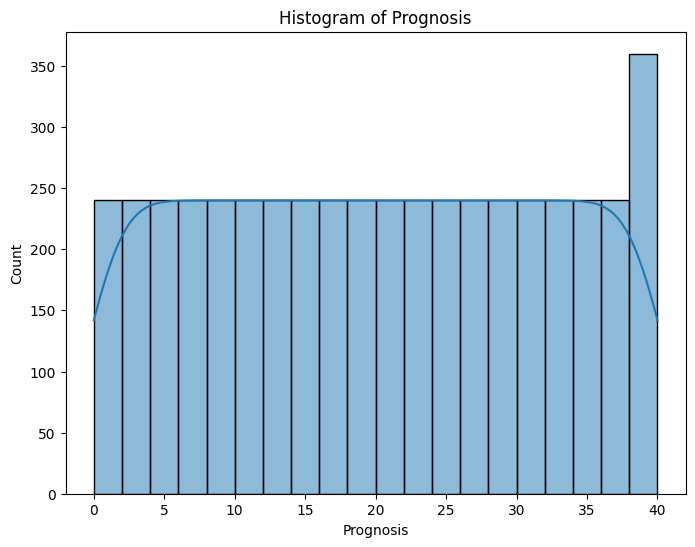

In [41]:
plt.figure(figsize=(8, 6))
sns.histplot(df1['prognosis'], bins=20, kde=True)
plt.title('Histogram of Prognosis')
plt.xlabel('Prognosis')
plt.ylabel('Count')
plt.show()

**Feature Variance using PCA**

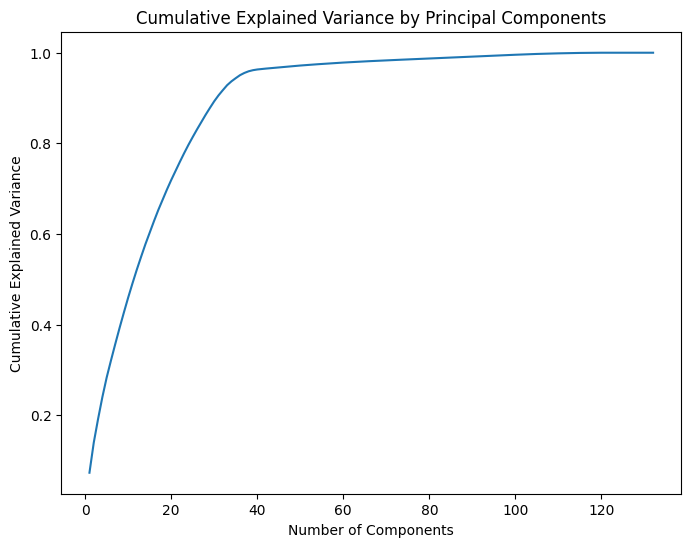

In [42]:
from sklearn.decomposition import PCA
pca = PCA().fit(df1.drop('prognosis', axis=1))
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_.cumsum())
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance by Principal Components')
plt.savefig('explained_variance_ratio_.png')
plt.show()

The plot shows that the first few principal components capture a significant portion of the data's variance. This suggests that the data can be effectively represented in a lower-dimensional space.

**Spliting the Data**

In [44]:
X = df1.drop('prognosis', axis=1) 
y = df1['prognosis']  
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

**Applying Support Vector Machine (SVM)**

In [51]:
svm = SVC(kernel='linear', C=1, random_state=42)
svm.fit(X_train, y_train)
svm.score(X_test, y_test)

1.0

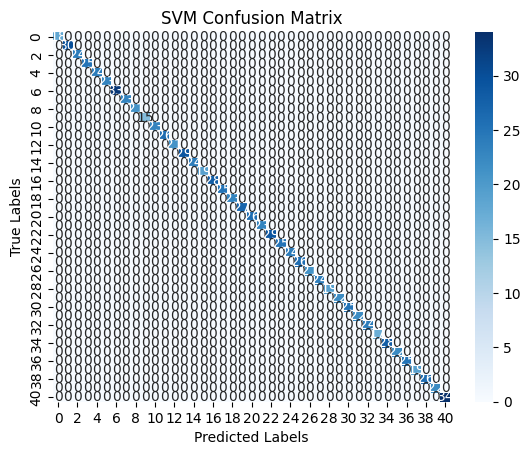

SVM Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        18
           1       1.00      1.00      1.00        30
           2       1.00      1.00      1.00        24
           3       1.00      1.00      1.00        25
           4       1.00      1.00      1.00        24
           5       1.00      1.00      1.00        23
           6       1.00      1.00      1.00        33
           7       1.00      1.00      1.00        23
           8       1.00      1.00      1.00        21
           9       1.00      1.00      1.00        15
          10       1.00      1.00      1.00        23
          11       1.00      1.00      1.00        26
          12       1.00      1.00      1.00        21
          13       1.00      1.00      1.00        29
          14       1.00      1.00      1.00        24
          15       1.00      1.00      1.00        19
          16       1.00      1.00      1.00        28


In [50]:
# Predict on test data
y_pred_svm = svm.predict(X_test)

# Confusion Matrix
cm_svm = confusion_matrix(y_test, y_pred_svm)
sns.heatmap(cm_svm, annot=True, fmt="d", cmap="Blues")
plt.title("SVM Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Classification Report
print("SVM Classification Report:")
print(classification_report(y_test, y_pred_svm))

**Applying Random Forest Classifier**

In [52]:
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
rf.score(X_test, y_test)

1.0

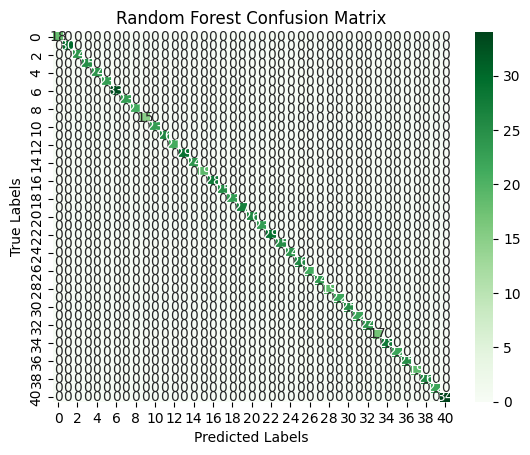

Random Forest Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        18
           1       1.00      1.00      1.00        30
           2       1.00      1.00      1.00        24
           3       1.00      1.00      1.00        25
           4       1.00      1.00      1.00        24
           5       1.00      1.00      1.00        23
           6       1.00      1.00      1.00        33
           7       1.00      1.00      1.00        23
           8       1.00      1.00      1.00        21
           9       1.00      1.00      1.00        15
          10       1.00      1.00      1.00        23
          11       1.00      1.00      1.00        26
          12       1.00      1.00      1.00        21
          13       1.00      1.00      1.00        29
          14       1.00      1.00      1.00        24
          15       1.00      1.00      1.00        19
          16       1.00      1.00      1.00 

In [53]:
# Predict on test data
y_pred_rf = rf.predict(X_test)

# Confusion Matrix
cm_rf = confusion_matrix(y_test, y_pred_rf)
sns.heatmap(cm_rf, annot=True, fmt="d", cmap="Greens")
plt.title("Random Forest Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Classification Report
print("Random Forest Classification Report:")
print(classification_report(y_test, y_pred_rf))

**Applying Decision Tree Classifier**

In [54]:
dt = DecisionTreeClassifier(random_state=42)
dt.fit(X_train, y_train)
dt.score(X_test, y_test)

1.0

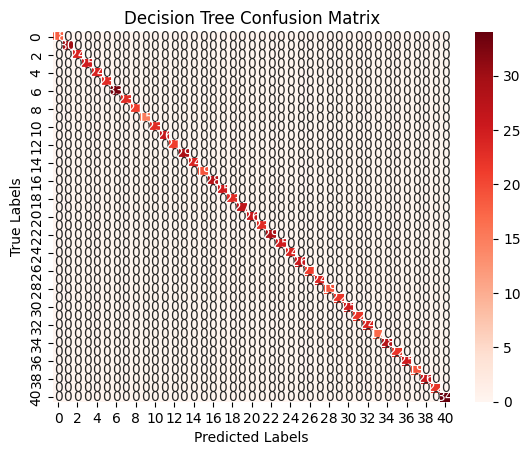

Decision Tree Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        18
           1       1.00      1.00      1.00        30
           2       1.00      1.00      1.00        24
           3       1.00      1.00      1.00        25
           4       1.00      1.00      1.00        24
           5       1.00      1.00      1.00        23
           6       1.00      1.00      1.00        33
           7       1.00      1.00      1.00        23
           8       1.00      1.00      1.00        21
           9       1.00      1.00      1.00        15
          10       1.00      1.00      1.00        23
          11       1.00      1.00      1.00        26
          12       1.00      1.00      1.00        21
          13       1.00      1.00      1.00        29
          14       1.00      1.00      1.00        24
          15       1.00      1.00      1.00        19
          16       1.00      1.00      1.00 

In [55]:
# Predict on test data
y_pred_dt = dt.predict(X_test)

# Confusion Matrix
cm_dt = confusion_matrix(y_test, y_pred_dt)
sns.heatmap(cm_dt, annot=True, fmt="d", cmap="Reds")
plt.title("Decision Tree Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Classification Report
print("Decision Tree Classification Report:")
print(classification_report(y_test, y_pred_dt))

**Applying XGBoost Classifier**

In [56]:
xgb = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)
xgb.fit(X_train, y_train)
xgb.score(X_test, y_test)

1.0

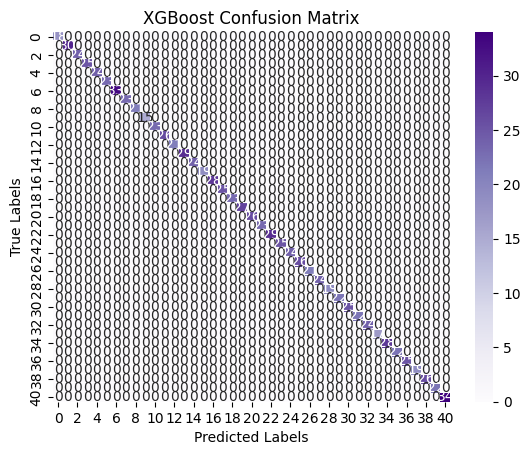

XGBoost Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        18
           1       1.00      1.00      1.00        30
           2       1.00      1.00      1.00        24
           3       1.00      1.00      1.00        25
           4       1.00      1.00      1.00        24
           5       1.00      1.00      1.00        23
           6       1.00      1.00      1.00        33
           7       1.00      1.00      1.00        23
           8       1.00      1.00      1.00        21
           9       1.00      1.00      1.00        15
          10       1.00      1.00      1.00        23
          11       1.00      1.00      1.00        26
          12       1.00      1.00      1.00        21
          13       1.00      1.00      1.00        29
          14       1.00      1.00      1.00        24
          15       1.00      1.00      1.00        19
          16       1.00      1.00      1.00       

In [57]:
# Predict on test data
y_pred_xgb = xgb.predict(X_test)

# Confusion Matrix
cm_xgb = confusion_matrix(y_test, y_pred_xgb)
sns.heatmap(cm_xgb, annot=True, fmt="d", cmap="Purples")
plt.title("XGBoost Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Classification Report
print("XGBoost Classification Report:")
print(classification_report(y_test, y_pred_xgb))

**Applying Logistic Regression**

In [58]:
lr = LogisticRegression(max_iter=1000, random_state=42)
lr.fit(X_train, y_train)
lr.score(X_test, y_test)

1.0

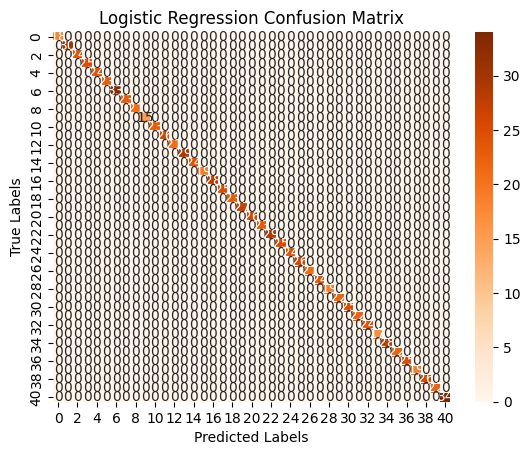

Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        18
           1       1.00      1.00      1.00        30
           2       1.00      1.00      1.00        24
           3       1.00      1.00      1.00        25
           4       1.00      1.00      1.00        24
           5       1.00      1.00      1.00        23
           6       1.00      1.00      1.00        33
           7       1.00      1.00      1.00        23
           8       1.00      1.00      1.00        21
           9       1.00      1.00      1.00        15
          10       1.00      1.00      1.00        23
          11       1.00      1.00      1.00        26
          12       1.00      1.00      1.00        21
          13       1.00      1.00      1.00        29
          14       1.00      1.00      1.00        24
          15       1.00      1.00      1.00        19
          16       1.00      1.00     

In [59]:
# Predict on test data
y_pred_lr = lr.predict(X_test)

# Confusion Matrix
cm_lr = confusion_matrix(y_test, y_pred_lr)
sns.heatmap(cm_lr, annot=True, fmt="d", cmap="Oranges")
plt.title("Logistic Regression Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Classification Report
print("Logistic Regression Classification Report:")
print(classification_report(y_test, y_pred_lr))

**Ensemble Model with Voting Classifier**

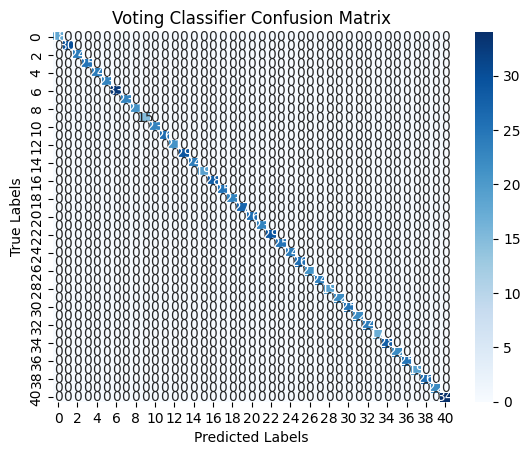

Voting Classifier Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        18
           1       1.00      1.00      1.00        30
           2       1.00      1.00      1.00        24
           3       1.00      1.00      1.00        25
           4       1.00      1.00      1.00        24
           5       1.00      1.00      1.00        23
           6       1.00      1.00      1.00        33
           7       1.00      1.00      1.00        23
           8       1.00      1.00      1.00        21
           9       1.00      1.00      1.00        15
          10       1.00      1.00      1.00        23
          11       1.00      1.00      1.00        26
          12       1.00      1.00      1.00        21
          13       1.00      1.00      1.00        29
          14       1.00      1.00      1.00        24
          15       1.00      1.00      1.00        19
          16       1.00      1.00      1

In [47]:
# Instantiate individual models
log_reg = LogisticRegression(max_iter=1000, random_state=42)
random_forest = RandomForestClassifier(random_state=42)
decision_tree = DecisionTreeClassifier(random_state=42)
xgboost = XGBClassifier(use_label_encoder=False, eval_metric="logloss", random_state=42)
svc = SVC(probability=True, random_state=42)

# Create Voting Classifier (hard or soft voting)
voting_clf = VotingClassifier(
    estimators=[
        ('lr', log_reg),
        ('rf', random_forest),
        ('dt', decision_tree),
        ('xgb', xgboost),
        ('svc', svc)
    ],
    voting='soft'  # use 'hard' for majority voting or 'soft' for average probability voting
)

# Train the ensemble model
voting_clf.fit(X_train, y_train)

# Predict on the test set
y_pred_ensemble = voting_clf.predict(X_test)

# Confusion Matrix for Voting Classifier
cm_ensemble = confusion_matrix(y_test, y_pred_ensemble)
sns.heatmap(cm_ensemble, annot=True, fmt="d", cmap="Blues")
plt.title("Voting Classifier Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Classification Report for Voting Classifier
print("Voting Classifier Classification Report:")
print(classification_report(y_test, y_pred_ensemble))
